In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import torch
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms

from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split

%matplotlib inline

In [3]:
df = pd.read_csv("./dataset/hasy-data-labels.csv")
df.head()

,path,symbol_id,latex,user_id
0,hasy-data/v2-00000.png,31,A,50
1,hasy-data/v2-00001.png,31,A,10
2,hasy-data/v2-00002.png,31,A,43
3,hasy-data/v2-00003.png,31,A,43
4,hasy-data/v2-00004.png,31,A,4435


In [4]:
unique_labels = set()

def find_unique(in_str):
    unique_labels.add(in_str)

df['symbol_id'].apply(find_unique)
    

0         None
1         None
2         None
3         None
4         None
          ... 
168228    None
168229    None
168230    None
168231    None
168232    None
Name: symbol_id, Length: 168233, dtype: object

In [5]:
df1 = df['symbol_id'].value_counts()
df1[0:6]

/var/folders/dk/x6xr9ng103sfssc512l2rrlw0000gn/T/ipykernel_34652/2806581650.py:2: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  df1[0:6]


183    3514
88     3400
944    2914
82     2601
166    2567
603    2518
Name: symbol_id, dtype: int64

In [6]:
wanted_lables = [183,88,944,82,166,603]
#  Integral ----- Sum (Sigma) ----- Infinity ----- Alpha ------ Xi ------ Equate (Three Lines)

In [7]:
final_df = df.loc[df['symbol_id'].isin(wanted_lables)]
len(final_df)

17514

In [15]:
from PIL import Image
import numpy
counter = 0
all_data  = np.array()

def create_image_array(in_path):
    img = Image.open(f'./dataset/{in_path}')
    np_img = numpy.array(img)
    all_data += (np_img)

final_df['data'] = final_df['path'].apply(create_image_array)

[[255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]]
[[255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]
 [255 255 255]]
[[255 255 255]
 [255 255 255]
 [255 25

/var/folders/dk/x6xr9ng103sfssc512l2rrlw0000gn/T/ipykernel_34652/3702418639.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df['data'] = final_df['path'].apply(create_image_array)


In [11]:
final_df.head()

,path,symbol_id,latex,user_id
608,hasy-data/v2-00608.png,82,\alpha,15
609,hasy-data/v2-00609.png,82,\alpha,10
610,hasy-data/v2-00610.png,82,\alpha,10
611,hasy-data/v2-00611.png,82,\alpha,10
612,hasy-data/v2-00612.png,82,\alpha,10


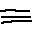

In [42]:
from IPython.display import Image
Image(filename='./dataset/hasy-data/v2-08559.png') 

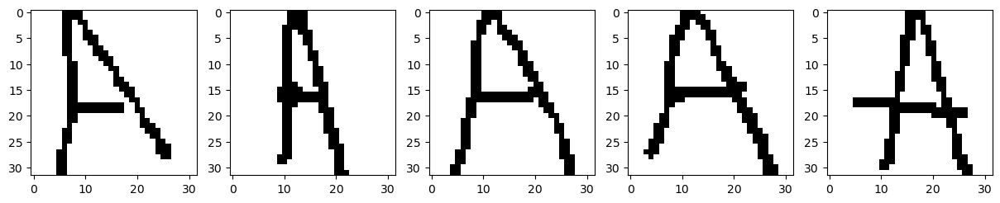

In [59]:
import matplotlib.image as img
import os
fig,ax = plt.subplots(1,5,figsize = (15,3))

for i,idx in enumerate(df[df['symbol_id'] == 88]['symbol_id'].iloc[-5:]):
    path = os.path.join("./dataset",df.iloc[i]["path"])
    ax[i].imshow(img.imread(path))

In [61]:
import numpy as np
import matplotlib.pyplot as plt

def imshow(image, ax=None, title=None, normalize=True):
    if ax is None:
        fig, ax = plt.subplots()
    image = image.numpy().transpose((1, 2, 0))

    if normalize:
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = std * image + mean
        image = np.clip(image, 0, 1)

    ax.imshow(image)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='both', length=0)
    ax.set_xticklabels('')
    ax.set_yticklabels('')

    return ax

In [67]:
class SymbolDataset(Dataset):
    def __init__(self, data, path , transform = None):
        super().__init__()
        self.data = data.values
        self.path = path
        self.transform = transform
        
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self,index):
        img_name,label = self.data[index]
        img_path = os.path.join(self.path, img_name)
        image = img.imread(img_path)
        if self.transform is not None:
            image = self.transform(image)
        return image, label

In [ ]:
transform = transforms.Compose([transforms.ToPILImage(),transforms.ToTensor(),transforms.Normalize(means,std)])